In [1]:
import torch
import torch.nn as nn

from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from PIL import Image

from torchvision import transforms
import torchvision.utils as vutils
import torch.optim as optim

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.animation as animation
from IPython.display import HTML
import os

In [4]:
IMAGE_SIZE = 64

BATCH_SIZE = 1024
WORKERS = 4

NGPUS = 3

NUM_CHANNELS = 3
LATENT_DIM = 100

G_FEATURES = 64
D_FEATURES = 64

BETA1=0.5
LR=0.0002
NUM_EPOCHS=25

In [6]:
class CelebADataset(Dataset):
    def __init__(self, img_dir, attr_file, transform=None, selected_attrs=None):
        """
        Args:
            img_dir: Directory with images
            attr_file: Path to list_attr_celeba.txt
            transform: Image transforms
            selected_attrs: List of attribute names to use (if None, uses all)
        """
        self.img_dir = img_dir
        self.transform = transform
        
        # Read attribute file
        self.attr_df = pd.read_csv(attr_file, header=1)
        
        # Get attribute names from first row (which becomes column names)
        self.attr_names = list(self.attr_df.columns[1:])  # Skip filename column
        
        # Select specific attributes if provided
        if selected_attrs is not None:
            self.selected_attrs = selected_attrs
            # Verify all selected attributes exist
            missing_attrs = set(selected_attrs) - set(self.attr_names)
            if missing_attrs:
                raise ValueError(f"Attributes not found: {missing_attrs}")
        else:
            self.selected_attrs = self.attr_names
        
        self.filenames = self.attr_df.iloc[:, 0].values  # First column is filename
        
    def __len__(self):
        return len(self.attr_df)
    
    def __getitem__(self, idx):
        # Get image
        img_name = self.filenames[idx]
        img_path = os.path.join(self.img_dir, 'img_align_celeba', 'img_align_celeba', img_name)
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        # Get labels for selected attributes
        labels = []
        for attr in self.selected_attrs:
            # Convert from {-1, 1} to {0, 1}
            label = (self.attr_df.loc[idx, attr] + 1) // 2
            labels.append(label)

        labels = torch.tensor(labels, dtype=torch.float32)
        
        return (image, labels)
    
    def get_attr_names(self):
        """Return list of selected attribute names"""
        return self.selected_attrs

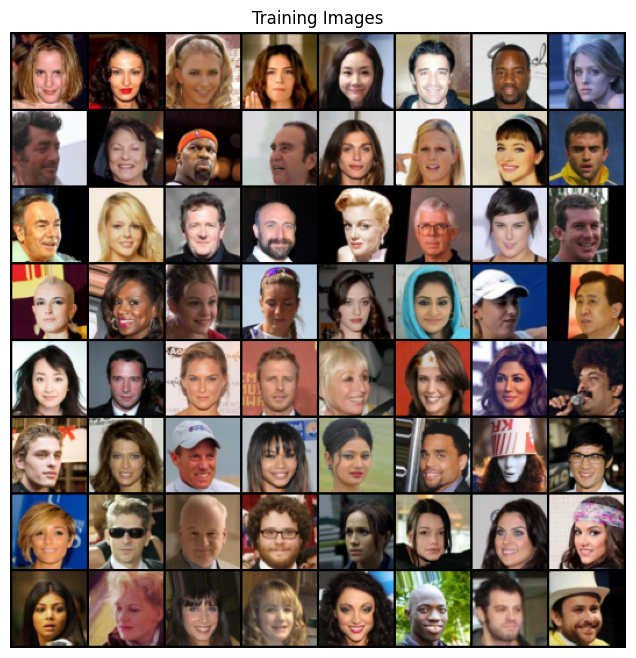

In [7]:
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

dataset = CelebADataset( './data/celeba', './data/celeba/list_attr_celeba.csv', transform=transform)

dataloader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE,
                                         shuffle=True, num_workers=WORKERS)
NUM_CLASSES = len(dataset.get_attr_names())
device = torch.device("cuda:0" if (torch.cuda.is_available() and NGPUS > 0) else "cpu")

# Plot some training images
(real_batch, labels) = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [9]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [2]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        INPUT_DIM = LATENT_DIM + NUM_CLASSES
        self.model = nn.Sequential(
            # input is Z_DIM, going into a convolutional layer
            nn.ConvTranspose2d(INPUT_DIM, G_FEATURES * 8, 4, 1, 0),
            nn.BatchNorm2d(G_FEATURES * 8),
            nn.ReLU(True),

            # state size. (G_FEATURES * 8) x 4 x 4
            nn.ConvTranspose2d(G_FEATURES * 8, G_FEATURES * 4, 4, 2, 1),
            nn.BatchNorm2d(G_FEATURES * 4),
            nn.ReLU(True),

            # state size. (G_FEATURES * 4) x 8 x 8
            nn.ConvTranspose2d(G_FEATURES * 4, G_FEATURES * 2, 4, 2, 1),
            nn.BatchNorm2d(G_FEATURES * 2),
            nn.ReLU(True),

            # state size. (G_FEATURES * 2) x 16 x 16
            nn.ConvTranspose2d(G_FEATURES * 2, G_FEATURES, 4, 2, 1),
            nn.BatchNorm2d(G_FEATURES),
            nn.ReLU(True),

            # state size. (G_FEATURES) x 32 x 32
            nn.ConvTranspose2d(G_FEATURES, NUM_CHANNELS, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, z, labels):
        labels = labels.unsqueeze(2).unsqueeze(3)  # [batch_size, num_classes, 1, 1]
        
        # Concatenate noise and labels
        input_tensor = torch.cat([z, labels], dim=1)  # [batch_size, latent_dim + num_classes, 1, 1]
        return self.model(input_tensor)
        

In [10]:
netG = Generator().to(device)

if (device.type == 'cuda') and (NGPUS > 1):
    netG = nn.DataParallel(netG, list(range(NGPUS)))

netG.apply(weights_init)

netG

DataParallel(
  (module): Generator(
    (model): Sequential(
      (0): ConvTranspose2d(140, 512, kernel_size=(4, 4), stride=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (13): Tanh()
    )
  )

In [ ]:
model_path = 'exports/netG_cgan_epoch_25.pth'
netG.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [189]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(NUM_CHANNELS + NUM_CLASSES, D_FEATURES, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(D_FEATURES, D_FEATURES * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_FEATURES * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(D_FEATURES * 2, D_FEATURES * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_FEATURES * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(D_FEATURES * 4, D_FEATURES * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_FEATURES * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(D_FEATURES * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid(),
        )

    def forward(self, image, labels):
        batch_size = image.size(0)
        
        # Expand labels to match image spatial dimensions
        labels = labels.unsqueeze(2).unsqueeze(3)  # [batch_size, num_classes, 1, 1]
        labels = labels.expand(batch_size, -1, IMAGE_SIZE, IMAGE_SIZE)  # [batch_size, num_classes, 64, 64]
        
        # Concatenate image and labels
        input_tensor = torch.cat([image, labels], dim=1)  # [batch_size, num_channels + num_classes, 64, 64]
        
        return self.model(input_tensor).view(-1)
        

In [190]:
netD = Discriminator().to(device)

if (device.type == 'cuda') and (NGPUS > 1):
    netD = nn.DataParallel(netD, list(range(NGPUS)))

netD.apply(weights_init)

netD

DataParallel(
  (module): Discriminator(
    (model): Sequential(
      (0): Conv2d(43, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  

In [191]:
criterion = nn.MSELoss()

fixed_noise = torch.randn(64, LATENT_DIM, 1, 1, device=device)

real_label = 0.9
fake_label = 0.

optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(BETA1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(BETA1, 0.999))

In [192]:
img_list = []
G_losses = []
D_losses = []
iters = 0

# Create fixed noise and labels for consistent evaluation
fixed_noise = torch.randn(64, LATENT_DIM, 1, 1, device=device)
fixed_labels = torch.randint(0, 2, (64, NUM_CLASSES), device=device).float()

print("Starting Training Loop...")
for epoch in range(NUM_EPOCHS):
    for i, data in enumerate(dataloader):
        
        ############################
        # (1) Update D network: maximize log(D(x,y)) + log(1 - D(G(z,y),y))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch - now includes labels
        real_cpu = data[0].to(device)
        real_labels = data[1].to(device)  # Get labels from dataset
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # Forward pass real batch through D with labels
        output = netD(real_cpu, real_labels)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors and random labels
        noise = torch.randn(b_size, LATENT_DIM, 1, 1, device=device)

        fake_labels = real_labels  # Same labels as real batch

        # Generate fake image batch with G using labels
        fake = netG(noise, fake_labels)
        label.fill_(fake_label)
        
        # Classify all fake batch with D using same labels
        output = netD(fake.detach(), fake_labels)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z,y),y))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake, fake_labels)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, NUM_EPOCHS, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise and fixed_labels
        if (iters % 500 == 0) or ((epoch == NUM_EPOCHS-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise, fixed_labels).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/25][0/198]	Loss_D: 0.5548	Loss_G: 0.6298	D(x): 0.6188	D(G(z)): 0.5915 / 0.1263
[0/25][50/198]	Loss_D: 0.1808	Loss_G: 0.8100	D(x): 0.9874	D(G(z)): 0.3594 / 0.0000
[0/25][100/198]	Loss_D: 0.1790	Loss_G: 0.7655	D(x): 0.7100	D(G(z)): 0.0423 / 0.0284
[0/25][150/198]	Loss_D: 0.3752	Loss_G: 0.6216	D(x): 0.4401	D(G(z)): 0.1199 / 0.1314
[1/25][0/198]	Loss_D: 0.5194	Loss_G: 0.4903	D(x): 0.4323	D(G(z)): 0.4491 / 0.2143
[1/25][50/198]	Loss_D: 0.3804	Loss_G: 0.5375	D(x): 0.5811	D(G(z)): 0.4466 / 0.1824
[1/25][100/198]	Loss_D: 0.4227	Loss_G: 0.3413	D(x): 0.4031	D(G(z)): 0.3460 / 0.3280
[1/25][150/198]	Loss_D: 0.3687	Loss_G: 0.3532	D(x): 0.5201	D(G(z)): 0.4413 / 0.3188
[2/25][0/198]	Loss_D: 0.4082	Loss_G: 0.3306	D(x): 0.4556	D(G(z)): 0.4370 / 0.3337
[2/25][50/198]	Loss_D: 0.4182	Loss_G: 0.2900	D(x): 0.4841	D(G(z)): 0.4722 / 0.3717
[2/25][100/198]	Loss_D: 0.3522	Loss_G: 0.3134	D(x): 0.4837	D(G(z)): 0.3842 / 0.3506
[2/25][150/198]	Loss_D: 0.4197	Loss_G: 0.2599	D(x): 0.4356	

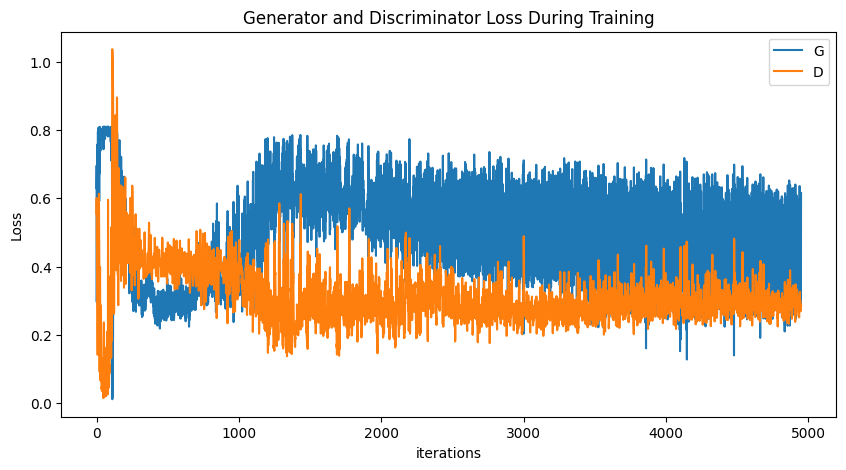

In [193]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

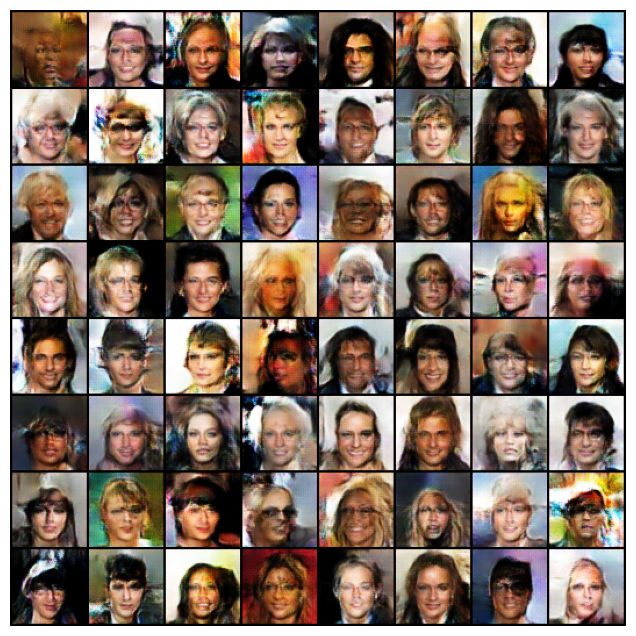

In [194]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

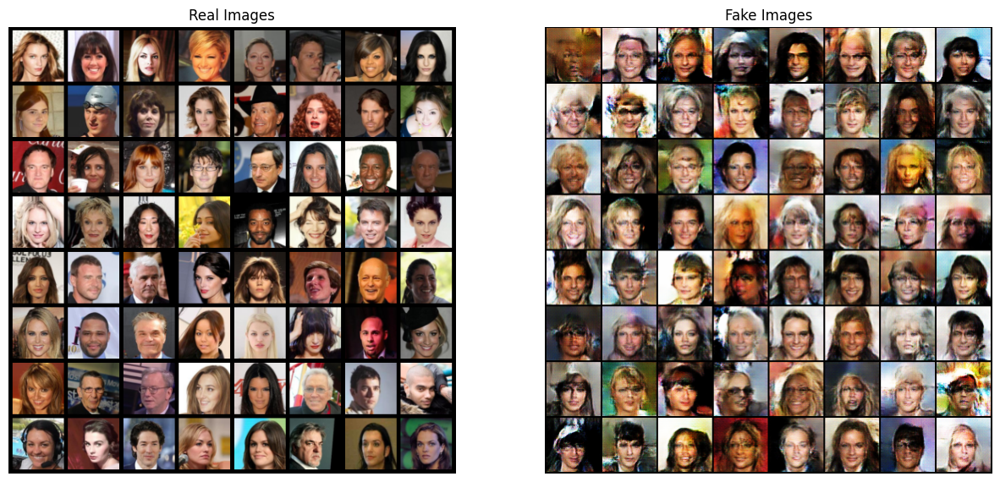

In [195]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

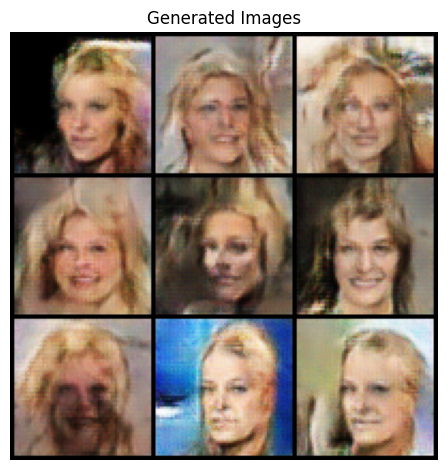

In [18]:
def generate_custom_face(netG, device, **attributes):
    """
    Generate face with custom attributes
    Usage: generate_custom_face(netG, device, Male=1, Smiling=1, Blond_Hair=1, Young=1)
    """
    netG.eval()
    
    # Attribute name to index mapping
    attr_map = {
        '5_o_Clock_Shadow': 0, 'Arched_Eyebrows': 1, 'Attractive': 2, 'Bags_Under_Eyes': 3,
        'Bald': 4, 'Bangs': 5, 'Big_Lips': 6, 'Big_Nose': 7, 'Black_Hair': 8, 'Blond_Hair': 9,
        'Blurry': 10, 'Brown_Hair': 11, 'Bushy_Eyebrows': 12, 'Chubby': 13, 'Double_Chin': 14,
        'Eyeglasses': 15, 'Goatee': 16, 'Gray_Hair': 17, 'Heavy_Makeup': 18, 'High_Cheekbones': 19,
        'Male': 20, 'Mouth_Slightly_Open': 21, 'Mustache': 22, 'Narrow_Eyes': 23, 'No_Beard': 24,
        'Oval_Face': 25, 'Pale_Skin': 26, 'Pointy_Nose': 27, 'Receding_Hairline': 28, 'Rosy_Cheeks': 29,
        'Sideburns': 30, 'Smiling': 31, 'Straight_Hair': 32, 'Wavy_Hair': 33, 'Wearing_Earrings': 34,
        'Wearing_Hat': 35, 'Wearing_Lipstick': 36, 'Wearing_Necklace': 37, 'Wearing_Necktie': 38, 'Young': 39
    }
    
    # Create label vector
    label = torch.zeros(40)
    for attr_name, value in attributes.items():
        if attr_name in attr_map:
            label[attr_map[attr_name]] = value
    
    label = label[:40].unsqueeze(0).to(device)
    noise = torch.randn(1, LATENT_DIM, 1, 1, device=device)
    
    with torch.no_grad():
        fake_image = netG(noise, label)
    
    return fake_image

generate_conditions = {'Blond_Hair': 1, 'Smiling': 1, 'Wearing_Lipstick': 1}

IMG_NUM = 9
gen_images = []
for i in range(IMG_NUM):
    image = generate_custom_face(netG, device, **generate_conditions)
    image = image[0]
    gen_images.append(image.cpu())

plt.axis("off")
plt.title("Generated Images")
gen_grid = vutils.make_grid(gen_images, padding=2, normalize=True, nrow=3)
plt.imshow(np.transpose(gen_grid, (1, 2, 0)))
plt.tight_layout()
plt.show()

In [197]:
torch.save(netG.state_dict(), f'exports/netG_cgan_epoch_{NUM_EPOCHS}.pth')